In [2]:
SDV5_MODEL_PATH = r'C:\Users\enesm\stable-diffusion-v1-5'

In [3]:
import logging
from pathlib import Path

import matplotlib.pyplot as plt
import torch
from diffusers import StableDiffusionPipeline
from fastcore.all import concat
from huggingface_hub import notebook_login
from PIL import Image


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


  0%|          | 0/50 [00:00<?, ?it/s]

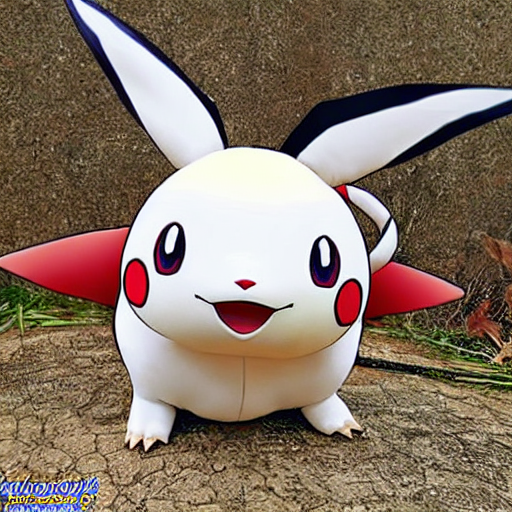

In [29]:
pipe = StableDiffusionPipeline.from_pretrained(SDV5_MODEL_PATH, revision="fp16", torch_dtype=torch.float16).to("cuda")
prompt = "a really realistic pokemon"
pipe(prompt).images[0]

In [4]:
def image_grid(imgs,rows,cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size = (cols*w , rows*h))
    for i, img in enumerate(imgs): grid.paste(img,box=(i%cols*w, i//cols*h))
    return grid

In [31]:
num_rows, num_cols=4,4
prompts = [prompt] * num_cols
images= concat(pipe(prompts, guiadence_scale = g).images for g in [0.1,3,7,14])

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


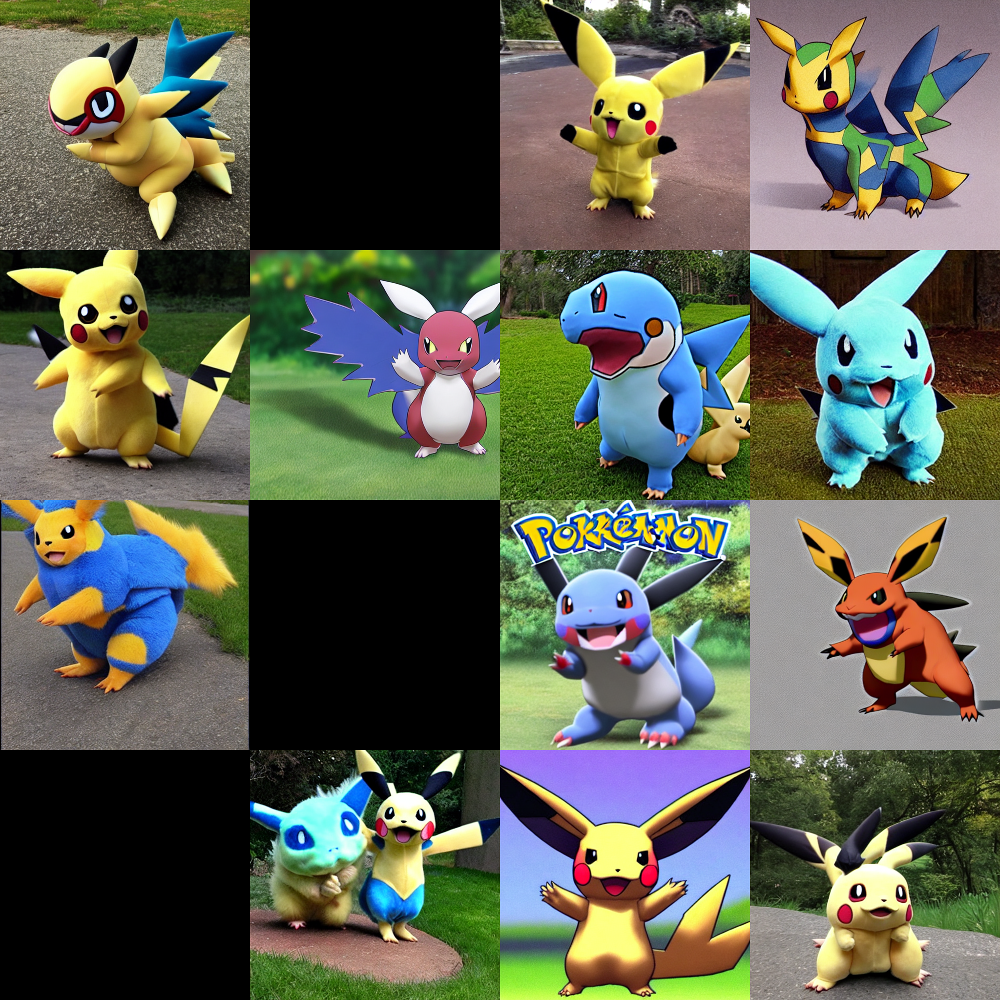

In [32]:
image_grid(images,rows=num_rows,cols=num_cols)

# Negative Prompts

  0%|          | 0/100 [00:00<?, ?it/s]

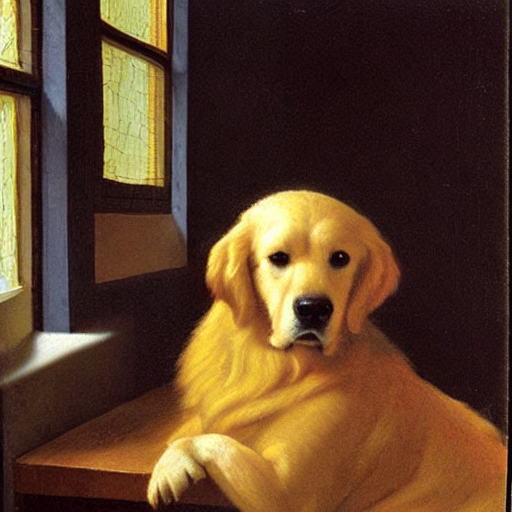

In [64]:
torch.manual_seed(6)
prompt= 'Golden Retriever in the style of Vermeer'
pipe(prompt,num_inference_steps=100).images[0]

  0%|          | 0/100 [00:00<?, ?it/s]

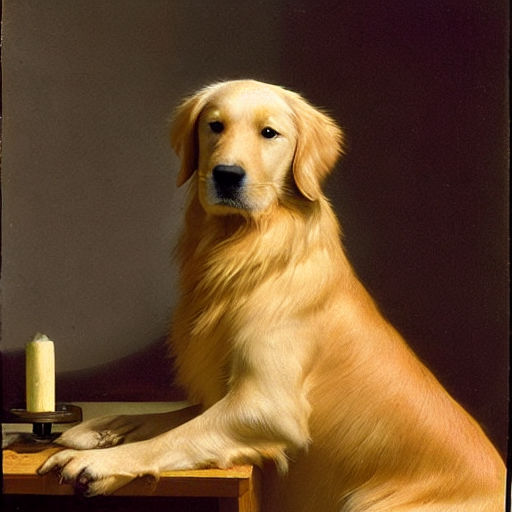

In [66]:
torch.manual_seed(6)
prompt= 'Golden Retriever in the style of Vermeer'
pipe(prompt,negative_prompt='dark colours',num_inference_steps=100).images[0]

# IMG2IMG

In [5]:
from diffusers import StableDiffusionImg2ImgPipeline
import os
from fastdownload import FastDownload
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(SDV5_MODEL_PATH, revision="fp16", torch_dtype=torch.float16).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


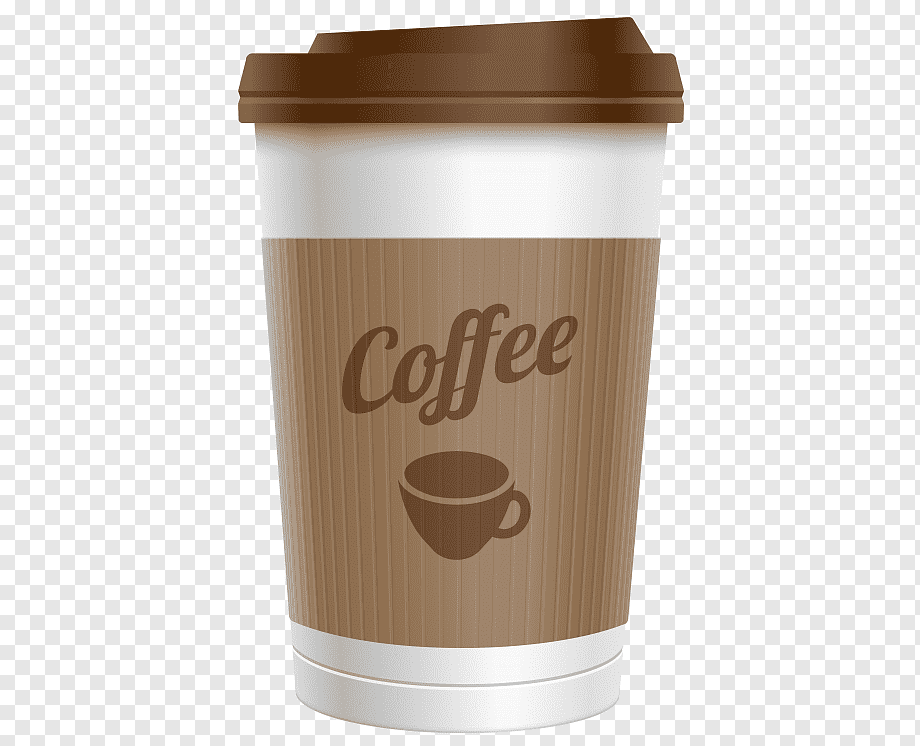

In [7]:
p=r"C:\Users\enesm\OneDrive\Masaüstü\IMAGES\png-transparent-coffee-cup-cafe-coffee-cafe-lid-coffee.png"
init_image = Image.open(p)
init_image=Image.open(p).convert('RGB')
init_image

  0%|          | 0/40 [00:00<?, ?it/s]

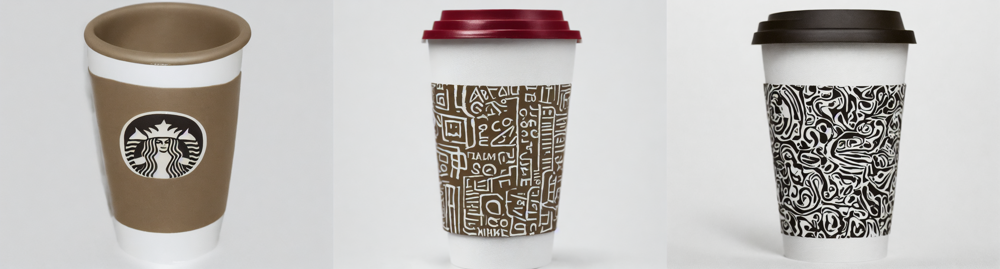

In [9]:
prompt = "a coffe cup"
images = pipe(prompt=prompt, num_images_per_prompt=3, image=init_image, strength=0.9, num_inference_steps=50).images
image_grid(images, rows=1, cols=3)

In [72]:
torch.manual_seed(1000)
prompt = 'Wolf howling at the moon, photorealistic 4K'
images = pipe(prompt=prompt,num_images_per_prompt=3,image=init_image,strength=0.8,num_inference_steps=50).images
image_grid(images,rows=1,cols=3)

TypeError: 'NoneType' object is not iterable